Comme on peut le voir sur l'histogramme, la plupart des valeurs sont comptées comme étant 100. Cela signifie une correspondance complète entre les 3 colonnes. Cependant, comme on peut le voir sur le résultat du code suivant, entre 75 et 98, vous verrez une correspondance entre les pays mais cela ne donne pas de valeurs de 100 en raison de la différence de langue. C'est pourquoi nous avons décidé de faire une correspondance pour convertir les valeurs en 3 ensembles. Ceux-ci sont 0, 50 et 100. La valeur 100 signifie que tous les pays correspondent les uns aux autres. 50 signifie que 2 colonnes correspondent et 0 signifie qu'il n'y a pas de correspondance.

In [54]:
df[(df['environmental_score'] > 75) & (df['environmental_score'] < 98)][["origins_tags", "manufacturing_places_tags", "countries_tags"]]


,origins_tags,manufacturing_places_tags,countries_tags
18955,"toledo,ohio,united-states","ohio,usa",united-states
67872,bc-canada,bc-canada,canada
119507,"edmonron,alberta","edmonton,alberta,canada",canada
175290,"manantial-amer-palatin,amer,selva-comarca,gerona-provincia,cataluna,espana","manantial-amer-palatin,amer,selva-comarca,gerona-provincia,cataluna,espana",spain
175300,spain,"moron-de-la-frontera,sevilla-provincia,andalucia,espana",spain
175302,"manantial-siguenza,moratilla-de-henares,siguenza,guadalajara-provincia,castilla-la-mancha,espana","manantial-siguenza,moratilla-de-henares,siguenza,guadalajara-provincia,castilla-la-mancha,espana",spain
175319,spain,"valdastillas,caceres-provincia,extremadura,espana",spain
175322,"zona-amparada-por-la-i-g-v-p-campo-de-la-guardia,la-guardia,toledo-provincia,castilla-la-mancha,espana","la-guardia,toledo-provincia,castilla-la-mancha,espana",spain
175324,"zona-amparada-por-la-d-o-ca-rioja,espana","logrono,la-rioja,espana",spain
175331,"villamalea,albacete-provincia,castilla-la-mancha,espana","villamalea,albacete-provincia,castilla-la-mancha,espana",spain


In [55]:
# Définir la fonction convert_number()
def convert_number(num):
    if num > 75:
        return 100
    elif num >= 34 and num <= 75:
        return 50
    else:
        return 10

# Appliquer la fonction convert_number() à la colonne 'col1'
df['environmental_score'] = df['environmental_score'].apply(lambda x: convert_number(x) if pd.notnull(x) else x)


In [56]:
df['environmental_score'].value_counts()

100.0    6647
50.0     5078
10.0     1135
Name: environmental_score, dtype: int64

En conséquence, ces scores sont plus raisonnables. La prochaine étape est packaging_tags. Nous allons vérifier comment nous pouvons adapter cette colonne dans un aspect environnemental.

Ce code crée un dictionnaire. Dans la colonne "packaging_tags", il y a plusieurs types d'emballage différents avec un grand nombre d'occurrences. Pour les catégoriser, nous avons utilisé le dictionnaire ci-dessus.

In [57]:
groups_pack = {
    "verre": [
        "bouteille",
        "verre",
        "bocal,verre",
        "bocal,verre,couvercle,metal",
        "bocal,verre,couvercle,metal,conserve",
        "bouteille-verre",
        "verre,bocal",
        "bocal-verre,couvercle-metal",
        "flacon,verre"
    ],
    "plastique": [
        "sachet,plastique",
        "plastique",
        "barquette,plastique",
        "bouteille,plastique",
        "carton,plastique",
        "sachet-plastique",
        "plastique,frais",
        "flacon,plastique",
        "pot,plastique",
        "pot,plastique,frais",
        "sachet,plastique,surgele",
        "sachet,plastique,sachet",
        "plastique,sachet",
        "plastique,barquette",
        "sachet,plastique,sous-atmosphere-protectrice",
        "sachet,plastique,etui,carton",
        "barquette,plastique,sous-atmosphere-protectrice",
        "sachet,plastique,sous-atmosphere-protectrice",
        "plastic-bottle",
        "barquette-plastique",
        "carton,sachet-plastique",
        "plastic,bag",
        "plastic,bottle",
        "plastique,surgele",
        "plastique,sous-vide",
        "bouteille,bouchon,plastique",
        "pots,plastique",
        "pot,plastique,frais",
        "plastique,tray,plastic-film",
        "plastique,sous-vide,frais",
        "frais,barquette-et-film-plastique-a-jeter,sous-atmosphere-protectrice",
        "plastic-tray,plastic-film"
    ],
    "carton": [
        "carton",
        "brique,carton",
        "carton,surgele",
        "carton,sachet,plastique",
        "boite,carton",
        "carton,aluminium",
        "carton,sachet-plastique",
        "carton,carton",
        "boite,carton,surgele",
        "carton,boite",
        "carton,plastique,frais",
        "carton,sachets,plastique",
        "carton,sachets",
        "carton,sachet-plastique",
        "caja,carton,plastico",
        "carton,brique",
        "carton,pots,plastique",
        "barquette,plastique,carton",
        "carton,boite",
        'boite,carton,plastique'
    ],
    "papier": [
        "papier",
        "sachet,papier",
        "papier,aluminium",
        "paper"
    ],
    "metal": [
        "bocal,verre,couvercle,metal",
        "conserve,metal",
        "boite,conserve,metal",
        "canette",
        "canette,aluminium"
    ],
    'frais': [
        'frais', 'barquette,plastique,frais', 'plastique,frais' ,'frais,barquette,plastique,opercule,film-plastique,sous-atmosphere-protectrice' ,'frais,pot,plastique,opercule,etui,carton' ,'frais,barquette,plastique' ,'frais,sachet-plastique' 'frais,barquette,plastique' ,'frais,pot,plastique,opercule' ,'frais,pot,plastique,frais', 'frais,barquette,plastique,sous-atmosphere-protectrice', 'frais,sachet-plastique,sous-atmosphere-protectrice'
        ],
    'surgele': [
        'surgele barquette,plastique,surgele',
        'carton,surgele',
        'plastique,sachet,plastique,surgele',
        'surgele,carton',
        'surgele,plastique', 'bolsa-de-plastico,ultracongelado',
        'bolsa-de-plastico,refrigerado'
    ],
    'conserve': ['conserve', 'conserve,conserve'],
    'boite': ['box', 'boite,surgele'],
    'other': ['05-pp','frais,pot,plastique,opercule,etui,carton', 'artikel', 'canette', 'packung', 'sachet,plastique,etui,carton', 'sachet,plastique,sous-atmosphere-protectrice', 'stuck', 'tetra-brik','dose']
}




In [58]:
df['group_pack_name'] = df['packaging_tags'].apply(lambda x: next((k for k, v in groups_pack.items() if x in v), None))


In [59]:
df['group_pack_name'].value_counts().iplot(kind='bar')

Dans le graphique ci-dessus, on peut voir que les emballages en plastique sont très répandus tandis que les boîtes sont les moins courantes. En utilisant ces catégories, nous pouvons effectivement calculer le "package_score". Le plastique est une substance difficile à décomposer dans la nature, donc nous attribuerions une faible valeur au "package_score". En revanche, en attribuant des valeurs élevées aux emballages en verre et frais, nous pouvons créer des valeurs de "package_score".

In [60]:
# Dictionnaire appelé "env_scores" qui est utilisé pour mapper les types d'emballage avec des scores environnementaux.
env_scores = {"frais": 90,"verre": 80, "metal": 70, "carton": 60, "papier": 50, "boite": 40, "surgele": 30, "conserve": 10, "Plastique": 5}

df["package_score"] = np.nan

for pkg_type, score in env_scores.items():
    mask = df["group_pack_name"].str.contains(pkg_type, case=False) & ~df["group_pack_name"].isna()
    df.loc[mask, "package_score"] = score


In [61]:
sum(df['package_score'].notnull())

32206

In [62]:
df['package_score'].iplot(kind='hist', bins=10)

Il est intéressant de noter que plus de la moitié des produits ont un score de 0 pour leur emballage, ce qui indique qu'ils sont probablement emballés dans du plastique, qui a un impact environnemental élevé. Les autres produits ont des scores variés en fonction du type d'emballage, allant de 1 pour le plastique à 90 pour les produits frais. Ces scores de package_score peuvent fournir des informations utiles sur l'impact environnemental des produits.

In [63]:
# créer une colonne "eco_score" avec des valeurs NaN
df["eco_score"] = np.nan

# calcule la moyenne des scores "package_score" et "environmental_score" pour chaque ligne où les deux valeurs ne sont pas nulles.
mask = ~(df["package_score"].isna() | df["environmental_score"].isna())
df.loc[mask, "eco_score"] = (df.loc[mask, "package_score"] + df.loc[mask, "environmental_score"]) / 2

# les scores sont arrondis à deux décimales et convertis en entiers avant d'être stockés dans la colonne "eco_score".
df.loc[mask, "eco_score"] = df.loc[mask, "eco_score"].round(2).astype(int)


Les scores de package_score et environmental_score ont été combinés pour créer eco_score en prenant leur moyenne. Nous savons que si cette valeur est élevée, le produit a subi moins de changements d'emplacement, n'a pas émis de gaz nocifs pour l'environnement et son type d'emballage est moins nocif pour l'environnement. Cette valeur sera utilisée dans le deuxième notebook.

In [64]:
df['eco_score'].iplot(kind='hist', bins=20)

<a id='sec:Nettoyagedesdonnées'></a>
# Nettoyage des données 


Pour aider l'application OpenFoodFact et montrer des méthodes de complétion de données, je me suis concentré sur la colonne "nutrition_grade_fr". Comme mentionné précédemment, de nombreuses données sont manquantes et je vais montrer différentes méthodes pour les compléter, notamment KNN, régression linéaire et imputation.

Ce code génère un diagramme en boîte (boxplot). Le diagramme est créé et affiche la distribution des valeurs de "nutrition-score-fr_100g" en fonction de la "nutrition_grade_fr".

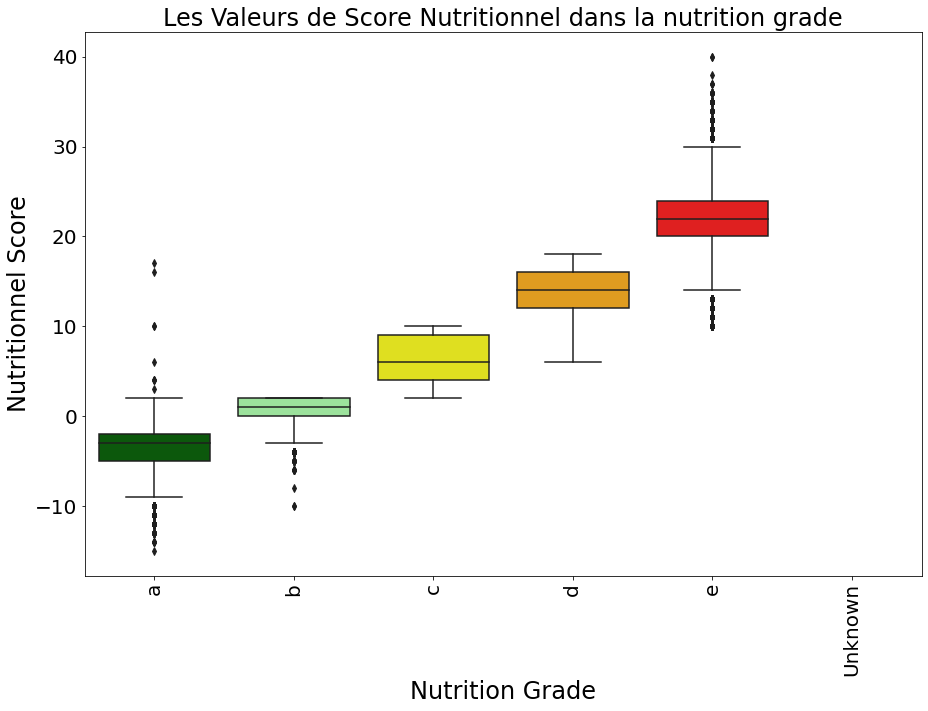

In [65]:
fig, ax = plt.subplots(figsize=(15,10))
sns.boxplot(data=df, x="nutrition_grade_fr", y="nutrition-score-fr_100g", palette=colors)
ax.set_title('Les Valeurs de Score Nutritionnel dans la nutrition grade', fontsize=24)
ax.set_xlabel('Nutrition Grade', fontsize=24)
ax.set_ylabel('Nutritionnel Score', fontsize=24)
plt.xticks(rotation=90)
ax.tick_params(axis='both', which='major', labelsize=20)

plt.show()

Le graphique en boîte ci-dessus montre que les scores nutritionnels basés sur la note nutritionnelle sont classés, avec de nombreux points aberrants dans les catégories "A" et "E". Les catégories "C" et "D" respectent généralement les scores nutritionnels basés sur la note. Par exemple, il y a quelques valeurs "B" dans la même catégorie que la note nutritionnelle "A". Par conséquent, il n'est pas facile de faire un commentaire sur la relation entre la note nutritionnelle et le score. Cependant, ces valeurs peuvent être catégorisées en fonction des valeurs moyennes de leur indice de catégorie principale. Ce graphique offre une vue panoramique de la relation entre la note nutritionnelle et le score.Comme vous pouvez vous y attendre, les produits qui ne sont pas classés selon une note nutritionnelle n'ont pas de score nutritionnel.

<a id='subsec:Mappingdedonnées'></a> 
## Mapping de données 

Pour interpréter facilement les valeurs nutritionnelles des produits alimentaires dans l'ensemble de données OpenFoodFact, il est important de remplir correctement la colonne nutrition_grade. Nous utiliserons les valeurs de main_category et product_name pour remplir cette colonne. Dans la première partie, nous utiliserons la méthode de mapping pour remplir cette colonne. Comme nous l'avons vu dans les graphiques précédents, les valeurs moyennes sont très utiles pour remplir la colonne nutrition_grade. Nous créerons donc un dictionnaire en utilisant les valeurs moyennes et utiliserons la méthode de mapping pour estimer les nutrition_grade manquants.

Tout d'abord, si nous connaissons la valeur de la "main_category" et que la valeur de "nutrition_grade" est inconnue, nous pouvons créer un dictionnaire basé sur les valeurs moyennes de la "main_category" et les valeurs de "nutrition_grade" correspondantes. Avec ce dictionnaire, nous pouvons estimer les valeurs de "nutrition_grade" inconnues. Dans la deuxième partie, nous allons faire correspondre les valeurs de grade "inconnues" dans la catégorie "product_name" avec la "main_category" et transférer des données à partir de là. Enfin, nous estimerons les colonnes manquantes dans la section "main_category" en fonction du "product_name" et retrouverons les valeurs de "nutrition_grade_fr" grâce à la correspondance.

#### Nous allons faire correspondre les valeurs de "nutrion_grade_fr" avec les valeurs de "main_category" et remplir les valeurs manquantes de "nutrition_grade_fr" en vérifiant cette correspondance.

In [66]:
# Initialiser une nouvelle liste de données
df_new = []
#Sélectionner les données pour lesquelles la catégorie principale est renseignée 
#et la note nutritionnelle est "Unknown"
data_new= df.loc[
                   (df['main_category'].notna())  &
                  (df['nutrition_grade_fr']=='Unknown')]

#Créer un nouveau DataFrame avec les colonnes à conserver
df_new=data_new[['main_category','nutrition_grade_fr']]

Ce graphique permet de visualiser rapidement les colonnes qui ont un grand nombre de valeurs manquantes et d'aider à décider comment traiter ces valeurs manquantes.

<AxesSubplot: >

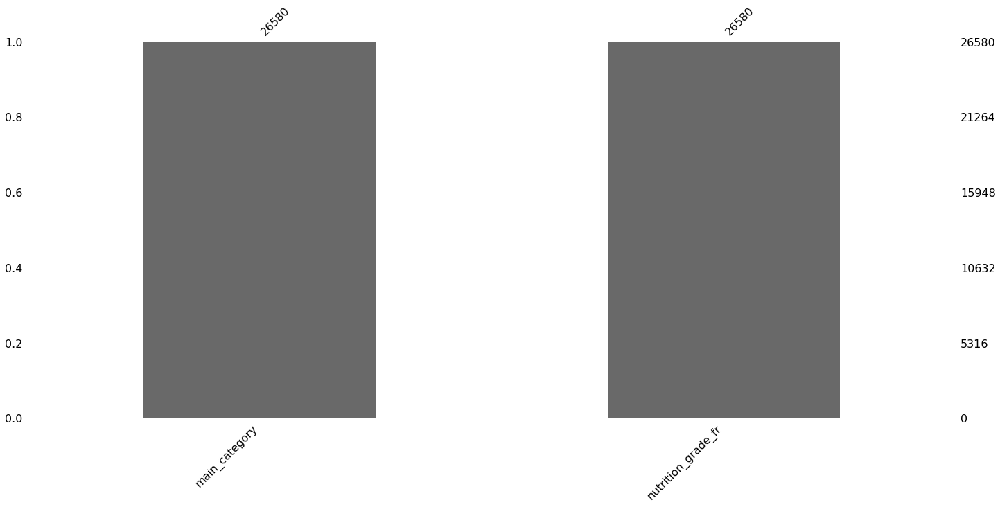

In [67]:
msno.bar(df_new)

Dans ce code, nous cherchons à deviner la catégorie de notation nutritionnelle manquante ('Unknown') en utilisant la catégorie principale ('main_category') d'un produit et son score nutritionnel moyen.

In [68]:
# On crée une nouvelle liste contenant les catégories principales avec des valeurs non nulles
newList = df_new['main_category'].value_counts().index.tolist()

# On groupe par catégorie principale et on calcule la moyenne des scores nutritionnels pour chaque catégorie
# On trie les catégories par ordre croissant de moyenne de score nutritionnel
# On supprime les catégories ayant des valeurs manquantes
mean_scores = df[df['main_category'].isin(newList)].groupby('main_category')['nutrition-score-fr_100g'].mean().sort_values().dropna()

# On crée un nouveau DataFrame pour stocker la moyenne des scores nutritionnels par catégorie principale
# On ajoute les moyennes de scores nutritionnels calculées précédemment dans la colonne "num-score"
# On crée une colonne "guessed_cat" vide qui sera remplie plus tard
df_new_category = pd.DataFrame(columns=['num-score', 'guessed_cat'])
df_new_category['num-score'] = mean_scores


   La première ligne définit les correspondances entre les plages de scores nutritionnels et les lettres catégorielles correspondantes.

   La deuxième ligne crée une nouvelle colonne 'guessed_cat' dans le DataFrame 'df_new_category' à partir de la colonne 'num-score' en appliquant la correspondance définie précédemment.

In [69]:

#Définir la correspondance entre la plage de numéros et la lettre catégorielle
mapping = {(-15, -0.01): 'a', (-0.01, 2.01): 'b', (2.01, 10.1): 'c', (10.1, 18.1): 'd', (18.1, 40): 'e'}


# Créer une nouvelle colonne 'guessed_cat' dans le DataFrame en utilisant la correspondance définie précédemment
df_new_category['guessed_cat'] = df_new_category['num-score'].apply(lambda x: next((v for k, v in mapping.items() if k[0] < x <= k[1]), None))

# Afficher le DataFrame pour vérifier le résultat
display(df_new_category)




,num-score,guessed_cat
main_category,,
petits-pois,-10.090909,a
chick-peas,-7.000000,a
frozen-peas,-7.000000,a
mushrooms,-6.277778,a
linsen,-6.000000,a
levures,-6.000000,a
fresh-vegetables,-5.900693,a
compotes-pour-bebe,-5.278689,a
pescado-congelado,-5.000000,a


In [70]:
#  ici, nous créons une variable match qui contiendra une correspondance entre la catégorie
# principale d'un produit et sa catégorie de nutrition (lettres A à E).
match = df_new[df_new['main_category'].isin(df_new_category.index.to_list())]['main_category']\
                                .apply(lambda x : df_new_category.loc[x]['guessed_cat'])

In [71]:
#cette ligne permet de mettre à jour la colonne nutrition_grade_fr 
#dans notre DataFrame df_new original en utilisant les correspondances stockées dans la variable match.
df.loc[match.index, 'nutrition_grade_fr']=match.values

Cette ligne de code renvoie la fréquence relative de chaque catégorie de grade nutritionnel dans la colonne "nutrition_grade_fr" du DataFrame df

In [72]:
df['nutrition_grade_fr'].value_counts(normalize=True)

Unknown    0.232563
d          0.224988
c          0.166849
e          0.139502
a          0.120810
b          0.115289
Name: nutrition_grade_fr, dtype: float64

Grâce à cette correspondance, nous avons réussi à remplir les valeurs catégorielles dans la colonne "nutrition_grade_fr". Nous avons complété 8 % de plus qu'avant.23 % est encore inconnu.

In [73]:
# On crée une nouvelle liste vide
df_new2 = []
# On sélectionne les lignes de df où la colonne main_category n'est pas nulle, 
# la colonne product_name n'est pas nulle et la colonne nutrition_grade_fr 
# ne contient pas la chaîne de caractères 'Unknown'.
df_new2= df.loc[
                    (df["main_category"].notna())  &
                    (df["product_name"].notna())  &
                    ~(df['nutrition_grade_fr']=='Unknown')]
                                                                
# On conserve seulement les colonnes définies 
# dans columns_to_keep pour les données sélectionnées et on les stocke dans df_new2.

df_new2=df_new2[['main_category','product_name','nutrition_grade_fr']]

<AxesSubplot: >

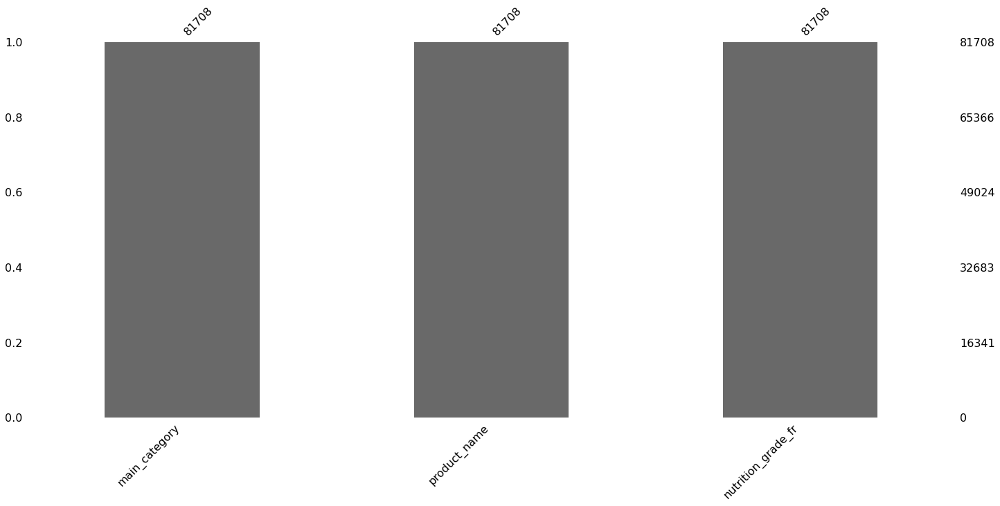

In [74]:
# permet de visualiser les valeurs manquantes 
# dans le DataFrame df_new2 sous forme de graphique à barres.
msno.bar(df_new2)

In [75]:
# Obtenir le nombre de produits par classe de nutrition et de noms de produit

df_new2['nutrition_grade_fr'].value_counts()

d          24861
c          20125
a          13352
e          12528
b          10842
Unknown        0
Name: nutrition_grade_fr, dtype: int64

In [76]:
df_new2['product_name'].value_counts().index.to_list()

["Huile d'olive vierge extra",
 'Tomato Ketchup',
 'Spaghetti',
 'Orange',
 'Mozzarella',
 'Mayonnaise',
 'Nutella',
 'Moutarde de Dijon',
 'Coca-Cola',
 "Jus d'orange",
 'Eau minérale naturelle',
 'Framboises',
 'Haricots rouges',
 'Lait demi-écrémé',
 'Jus de pomme',
 'Pois chiches',
 'Coquillettes',
 'Lait de coco',
 'Mayonnaise à la moutarde de Dijon',
 'Aceite de oliva virgen extra &quot;Esencia Andalusí&quot;',
 'Ketchup',
 'Corn Flakes',
 'Eau de source',
 'Olives vertes dénoyautées',
 'Macédoine de légumes',
 'Frische Vollmilch',
 'Quinoa',
 'Curry',
 'Champignons de Paris',
 'Cola',
 'Gazpacho',
 'Ratatouille',
 'Limonade',
 'Huile de tournesol',
 'Lentilles vertes',
 'Sirop de grenadine',
 'Blonde',
 'Haricots verts extra fins',
 'Pâte à tartiner aux noisettes',
 'Miel de fleurs',
 'Cacahuètes grillées et salées',
 'Sucre en poudre',
 'Bière blonde',
 'Lardons fumés',
 'Cappuccino',
 'Houmous',
 'Riz Basmati',
 'Salsifis',
 'Camembert',
 'Nesquik',
 'Riz long grain',
 'Vinaig

In [77]:
# Trouver les produits avec la note nutritionnelle manquante
indexer = df['nutrition_grade_fr'] == 'Unknown'
product_names = df.loc[indexer & df['product_name'].isin(df_new2['product_name'].value_counts().index.to_list()), 'product_name']

# Mapper les notes nutritionnelles des produits inconnus en utilisant les correspondances des produits connus
df_new2[df_new2['product_name'].isin(product_names.value_counts().index.to_list())]['nutrition_grade_fr']

# Obtenir les noms des produits avec la note nutritionnelle manquante
unknown_products = df.loc[df['nutrition_grade_fr'] == 'Unknown', 'product_name']

# Créer une DataFrame avec les noms de produits uniques et leurs notes nutritionnelles correspondantes
nutrition_mapping = df_new2.drop_duplicates(subset='product_name').set_index('product_name')['nutrition_grade_fr']

# Mapper les notes nutritionnelles aux produits inconnus
df.loc[unknown_products.index, 'nutrition_grade_fr'] = unknown_products.map(nutrition_mapping)

# Remplacer les valeurs manquantes de la note nutritionnelle par 'Unknown'
df['nutrition_grade_fr'] = df['nutrition_grade_fr'].fillna('Unknown')

# Obtenir le nombre de produits par classe de nutrition après le nettoyage
df['nutrition_grade_fr'].value_counts()

d          74370
Unknown    68178
c          55156
e          45572
a          39536
b          37592
Name: nutrition_grade_fr, dtype: int64

In [78]:
df['nutrition_grade_fr'].value_counts(normalize=True)

d          0.232113
Unknown    0.212788
c          0.172145
e          0.142233
a          0.123394
b          0.117327
Name: nutrition_grade_fr, dtype: float64

l'incomplétude de la colonne de données est passée à 21 %.

In [79]:
# liste des noms de colonnes à conserver dans le DataFrame résultant
columns_to_keep = ['main_category', 'product_name','nutrition_grade_fr']
# initialisation d'une liste vide pour stocker le DataFrame résultant
df_new3 = []
# sélectionne les lignes du DataFrame selon certaines conditions
df_new3= df.loc[

                    (df["main_category"].notna())  &
                    (df["product_name"].notna()) ]
            
                                                                

# sélectionne uniquement les colonnes spécifiées dans la liste 
# columns_to_keep pour le DataFrame résultant
df_new3=df_new3[columns_to_keep]

In [80]:
# liste des noms de colonnes à conserver dans le DataFrame résultant
columns_to_keep = ['main_category', 'product_name','nutrition_grade_fr']
# initialisation d'une liste vide pour stocker le DataFrame résultant
df_new4 = []
# sélectionne les lignes du DataFrame selon certaines conditions
df_new4= df.loc[

                    (df["main_category"].isna())  &
                    (df["product_name"].notna())  &
                   (df['nutrition_grade_fr']=='Unknown')]
                                                                

# sélectionne uniquement les colonnes spécifiées dans la liste 
# columns_to_keep pour le DataFrame résultant
df_new4=df_new4[columns_to_keep]

<AxesSubplot: >

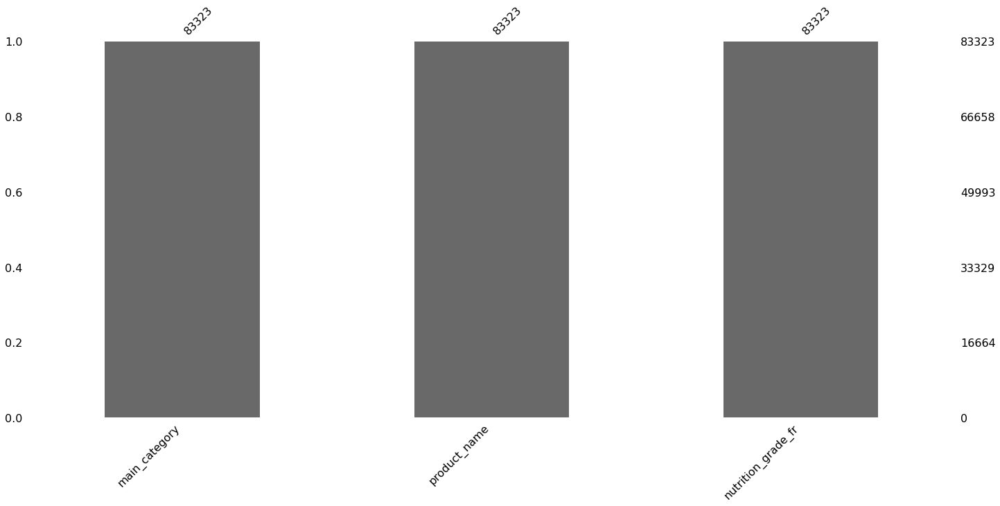

In [81]:
msno.bar(df_new3)

<AxesSubplot: >

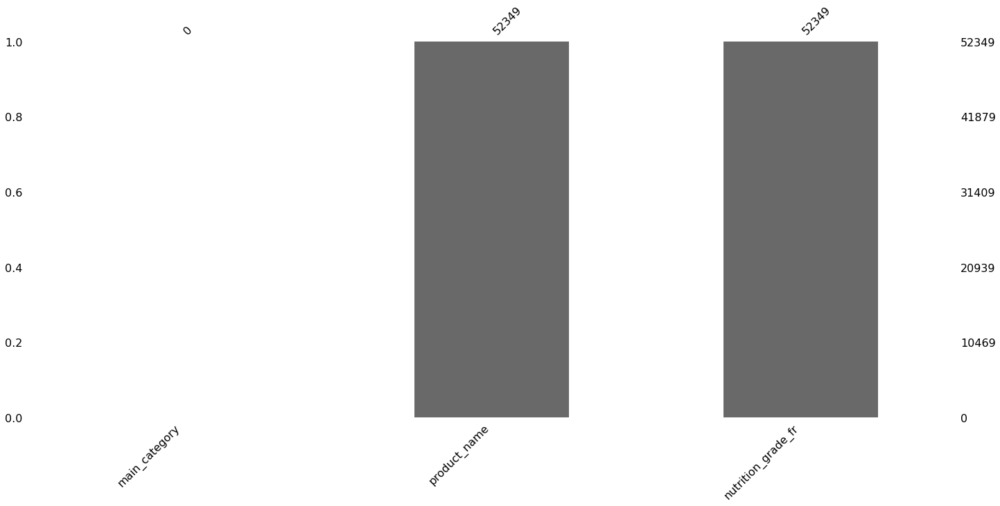

In [82]:
msno.bar(df_new4)

In [83]:
df_new3['main_category'].value_counts().index.to_list()

['beverages',
 'groceries',
 'chocolates',
 'plant-based-foods-and-beverages',
 'canned-foods',
 'biscuits',
 'meals',
 'sugary-snacks',
 'frozen-foods',
 'breakfasts',
 'cheeses',
 'breads',
 'desserts',
 'pastas',
 'meals-with-meat',
 'cakes',
 'chips-and-fries',
 'salted-spreads',
 'candies',
 'fresh-vegetables',
 'milks',
 'yogurts',
 'soups',
 'condiments',
 'salty-snacks',
 'jams',
 'fruits',
 'farming-products',
 'meats',
 'waters',
 'spices',
 'sodas',
 'nuts',
 'poultries',
 'french-cheeses',
 'sandwiches',
 'ice-creams',
 'rices',
 'baby-foods',
 'sausages',
 'butters',
 'fruit-juices',
 'hams',
 'cow-cheeses',
 'spreads',
 'saucissons',
 'labeled-products',
 'fishes',
 'creams',
 'salmons',
 'dried-fruits',
 'fruit-yogurts',
 'pickles',
 'prepared-meats',
 'herbal-teas',
 'breaded-products',
 'teas',
 'pates-a-tartiner',
 'fruit-nectars',
 'vegetable-oils',
 'tunas',
 'cookies',
 'canned-sardines',
 'seafood',
 'sugars',
 'salades-composees',
 'dairies',
 'olive-oils',
 'squ

In [84]:
df_new4['product_name'].value_counts().head(1000)

Soda                                                                  100
Sparkling Water                                                        79
Icing Decorations                                                      66
Sparkling Water Beverage                                               63
Hot Sauce                                                              57
Root Beer                                                              52
Canola Oil                                                             51
Syrup                                                                  47
Organic Extra Virgin Olive Oil                                         46
Soda, Orange                                                           45
Drink Mix                                                              43
Seltzer                                                                42
Maraschino Cherries                                                    42
Sweet Relish                          

In [85]:
#Import des bibliothèques nécessaires
from difflib import SequenceMatcher
from concurrent.futures import ThreadPoolExecutor

# Définir les colonnes
col1 = 'product_name'
col2 = 'main_category'
colx = df_new4['product_name'].value_counts().head(1000).index.astype(str).to_numpy()
coly = df_new3['main_category'].value_counts().index.to_numpy()

# Trouver le score de similarité entre les noms de produits et les principales catégories
def calculate_score(pair):
    string1, string2 = pair
    score = SequenceMatcher(None, string1.lower(), string2.lower()).ratio() * 100
    return (string1, string2, score)

# Utiliser ThreadPoolExecutor pour paralléliser le calcul
with ThreadPoolExecutor() as executor:
    results = list(executor.map(calculate_score, np.array(np.meshgrid(colx, coly)).T.reshape(-1, 2)))

# Filtrer les valeurs nulles et créer un DataFrame
df_results = pd.DataFrame(results, columns=[col1, col2, 'similarity_score'])
df_results.dropna(inplace=True)



In [86]:
display(df_results)

,product_name,main_category,similarity_score
0,Soda,beverages,15.384615
1,Soda,groceries,15.384615
2,Soda,chocolates,14.285714
3,Soda,plant-based-foods-and-beverages,22.857143
4,Soda,canned-foods,25.000000
...,...,...,...
3285995,"Pines, Barley Grass Powder",tomates-farcies,29.268293
3285996,"Pines, Barley Grass Powder",feuillete-jambon-emmental,23.529412
3285997,"Pines, Barley Grass Powder",feuilletes-chevre-epinards,23.076923
3285998,"Pines, Barley Grass Powder",cake-sale,28.571429


In [87]:
#Filtrer les lignes avec un score de similarité inférieur à 60
df_results = df_results[df_results['similarity_score'] >= 60]

# Regrouper par nom de produit et trouver le score de similarité maximum et la catégorie principale correspondante
df_max = df_results.groupby(col1).apply(lambda x: x.loc[x['similarity_score'].idxmax()]).reset_index(drop=True)




In [88]:
display(df_max)

,product_name,main_category,similarity_score
0,100% Apple Cider,apple-cider,74.074074
1,100% Apple Juice,apple-juices,71.428571
2,100% Cranberry Juice,cranberry-juice-drink,68.292683
3,100% Extra Virgin Olive Oil,virgin-olive-oils,63.636364
4,100% Grape Juice,grapefruit-juices,60.606061
5,100% Juice,juice,66.666667
6,"100% Juice, Cranberry",jus-de-cranberry,64.864865
7,100% Prune Juice,prune-juice,74.074074
8,100% Pure Olive Oil,pure-cod-liver-oil,64.864865
9,100% Pure Vegetable Oil,vegetable-oils,64.864865


In [89]:
# Obtenir la liste des principales catégories dans l'ordre correct
cat_order = df_max['main_category'].to_list()

# Obtenir la moyenne du score nutritionnel pour chaque catégorie principale et trier par ordre croissant
df_new_category1 = pd.DataFrame(columns=['num-score','nutrition_grade_fr'])
df_new_category1['num-score'] = df[df['main_category'].isin(cat_order)].groupby('main_category')['nutrition-score-fr_100g'].mean()

df_new_category1

,num-score,nutrition_grade_fr
main_category,,
agua-mineral-natural,NaN,NaN
alcool,NaN,NaN
alsace,NaN,NaN
anchoas-en-aceite-de-oliva,NaN,NaN
aoli-sauce,NaN,NaN
apfelschorle,NaN,NaN
appenzeller,19.000000,NaN
apple-cider,NaN,NaN
apple-cider-vinegar,NaN,NaN


In [90]:
# Définir la correspondance entre la plage de nombres et la lettre catégorielle
mapping = {(-15, -0.01): 'a', (-0.01, 2.01): 'b', (2.01, 10.1): 'c', (10.1, 18.1): 'd', (18.1, 40): 'e'}

# Créer une nouvelle colonne 'guessed_cat' dans le DataFrame en utilisant la correspondance
df_new_category1['nutrition_grade_fr'] = df_new_category1['num-score'].apply(lambda x: next((v for k, v in mapping.items() if k[0] < x <= k[1]), None))



In [91]:
df_new_category1 = df_new_category1.reset_index()

In [92]:
# Obtenir la liste des catégories principales dans le bon ordre
cat_order = df_max['main_category'].unique()

# Créer une nouvelle colonne dans df_new_category1 avec le même ordre que cat_order
df_new_category1['cat_order'] = pd.Categorical(df_new_category1['main_category'], categories=cat_order, ordered=True)

# Fusionner df_max et df_new_category1 sur 'main_category'
df_merged = df_max.merge(df_new_category1[['main_category', 'nutrition_grade_fr']], on='main_category', how='left')



In [93]:
# Créer une série qui mappe chaque nom de produit à sa note nutritionnelle
map_gradeProductName = df_merged.drop_duplicates(subset='product_name').set_index('product_name')['nutrition_grade_fr']
# Sélectionner les produits inconnus dont le grade nutritionnel doit être déterminé
unknownGradeparProduct = df_new4[df_new4['product_name'].isin(df_merged['product_name'].unique())]
# Supprimer les colonnes inutiles pour le merge
unknownGradeparProduct.pop('main_category')
unknownGradeparProduct.pop('nutrition_grade_fr')
#Mapper les grades nutritionnels pour les produits inconnus et les ajouter au dataframe original
df.loc[unknownGradeparProduct.index, 'nutrition_grade_fr'] = unknownGradeparProduct['product_name'].map(map_gradeProductName)


In [94]:
len(unknownGradeparProduct.index)

3852

In [95]:
df['nutrition_grade_fr'].value_counts(normalize=True)

d          0.235411
Unknown    0.201660
c          0.174816
e          0.143898
a          0.124427
b          0.119787
Name: nutrition_grade_fr, dtype: float64

Grâce à cette dernière analyse, j'ai réussi à maintenir le pourcentage des données de nutrition grade inconnues à 20%. 11% des données ont été complétées grâce à la méthode de mapping.

<a id='subsec:MéthodeKNN'></a> 
### Méthode KNN

Jusqu'à présent, nous avons déterminé les valeurs de nutrition grade en classant les valeurs moyennes de nutrition score sous les catégories main_category et product_name. Maintenant, nous allons confirmer ces valeurs à l'aide de la méthode KNN. Pour ce faire, nous utiliserons les valeurs nutritionnelles ('energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'salt_100g', 'nutrition_grade_fr') comme entrées pour KNN et nous utiliserons les valeurs que nous avons déterminées précédemment comme valeurs devinées.

In [96]:
# Créer une liste des valeurs à vérifier
values_to_check = list(match.index) + list(unknownGradeparProduct.index) + list(unknown_products.index)

df_reset = df.copy().reset_index(drop=True)

# Convertir un tableau numpy en série pandas et réinitialiser l'index
bool_series = pd.Series(df_reset.index.isin(values_to_check)).reset_index(drop=True)

# Remplacer les valeurs manquantes de la colonne 'nutrition_grade_fr' avec la valeur 'Unknown' là où la condition est vraie
df_reset.loc[bool_series, 'nutrition_grade_fr'] = df_reset.loc[bool_series, 'nutrition_grade_fr'].fillna('Unknown')
# Sélectionner les valeurs de la colonne 'nutrition_grade_fr' où la condition est vraie et ne contiennent pas la valeur 'Unknown'
df_reset.loc[bool_series & ~df_reset['nutrition_grade_fr'].isin(['Unknown'])]['nutrition_grade_fr']


0         a
101       d
144       c
169       d
170       c
         ..
320390    c
320391    a
320393    d
320400    b
320401    c
Name: nutrition_grade_fr, Length: 73669, dtype: category
Categories (6, object): ['a' < 'b' < 'c' < 'd' < 'e' < 'Unknown']

In [97]:
# On définit la liste des colonnes à conserver dans 
columns_to_keep = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g',
                    'proteins_100g', 'salt_100g','nutrition_grade_fr']
# On crée une nouvelle liste vide
df_new5 = []
#On sélectionne les données du dataframe original pour lesquelles 
# les colonnes d'intérêt ne contiennent pas de valeurs nulles, 
# et la colonne 'nutrition_grade_fr' ne contient pas la valeur 'Unknown'. 

df_new5= df.loc[
                    (df["energy_100g"].notna())  &
                    (df["fat_100g"].notna())  &
                    (df["sugars_100g"].notna())  &
                    (df["carbohydrates_100g"].notna())  &
                    (df["energy_100g"].notna())  &
                    (df["proteins_100g"].notna())  &
                    (df["salt_100g"].notna()) &
                     ~(bool_series)  &
                    ~(df['nutrition_grade_fr']=='Unknown')]
                                                               
# On conserve seulement les colonnes définies 
# dans columns_to_keep pour les données sélectionnées et on les stocke dans df_new5.

df_new5=df_new5[columns_to_keep].dropna()
#On effectue une opération de one-hot encoding sur la colonne 
#'nutrition_grade_fr', qui est une variable catégorielle, 
# en créant des colonnes binaires pour chaque catégorie.
one_hot = pd.get_dummies(df_new5['nutrition_grade_fr'])
# On ajoute le dataframe one-hot encodé au dataframe original.
df_new5 = pd.concat([df_new5, one_hot], axis=1)
#On supprime les colonnes 'nutrition_grade_fr' et 'Unknown' du dataframe
# car elles ne sont plus nécessaires après l'opération de one-hot encoding.
# df_new5.drop(['nutrition_grade_fr', 'Unknown'], axis=1,inplace=True)

<AxesSubplot: >

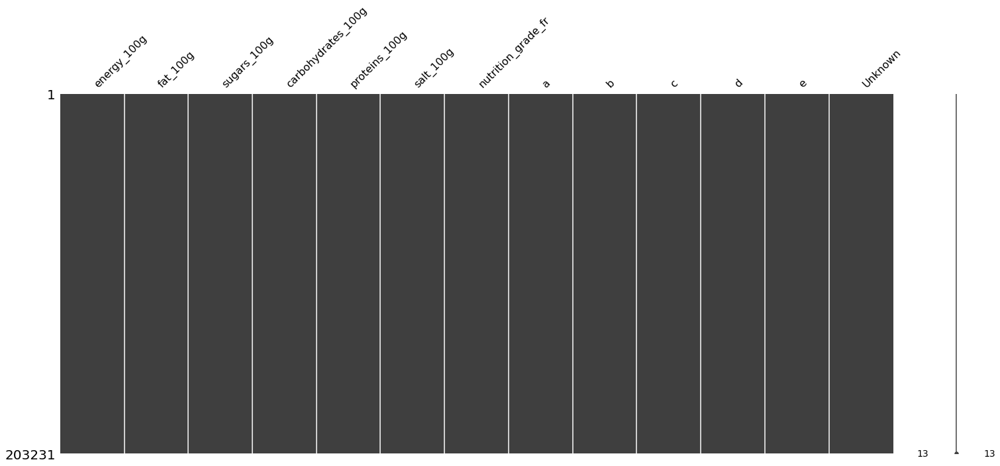

In [98]:
msno.matrix(df_new5)

In [99]:
# On définit les colonnes à conserver
columns_to_keep = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'salt_100g','nutrition_grade_fr']

# On crée une nouvelle liste vide
df_new6 = []

# On sélectionne les lignes de df_reset où :
# - bool_series est True
# - la colonne energy_100g n'est pas nulle
# - la colonne fat_100g n'est pas nulle
# - la colonne sugars_100g n'est pas nulle
# - la colonne carbohydrates_100g n'est pas nulle
# - la colonne proteins_100g n'est pas nulle
# - la colonne salt_100g n'est pas nulle
# - la colonne nutrition_grade_fr n'est pas égale à 'Unknown'
# On conserve seulement les colonnes définies dans columns_to_keep pour les données sélectionnées et on supprime les lignes contenant des valeurs nulles
df_new6 = df_reset.loc[bool_series &  
                       ~df_reset['nutrition_grade_fr'].isin(['Unknown'])][columns_to_keep].dropna()


<AxesSubplot: >

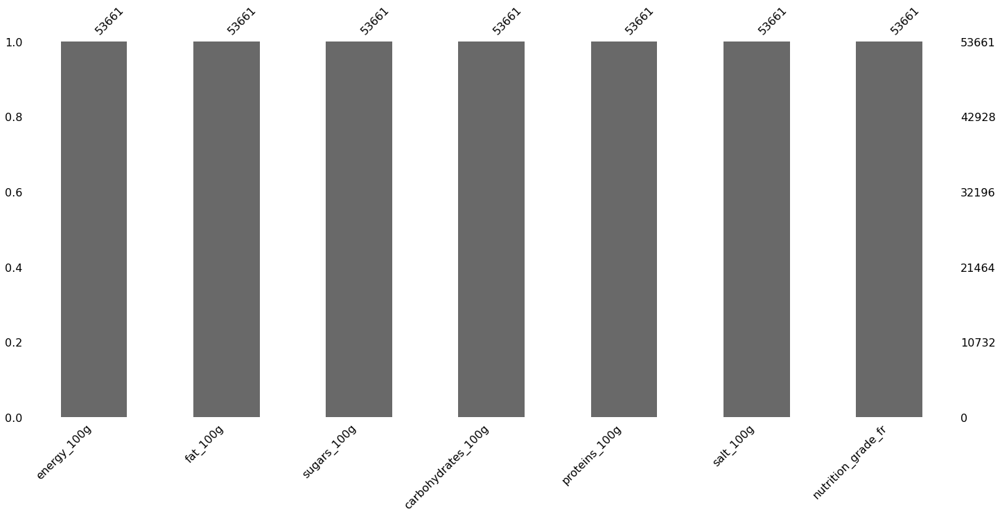

In [100]:
msno.bar(df_new6)

In [101]:
df_new6.index

Int64Index([   175,    236,    298,    300,    303,    438,    504,    506,
               507,    511,
            ...
            320295, 320296, 320297, 320300, 320313, 320334, 320370, 320374,
            320383, 320400],
           dtype='int64', length=53661)

In [102]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# On définit les colonnes à conserver
columns_to_keep = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g',
                    'proteins_100g', 'salt_100g']
# On définit les colonnes à utiliser comme target pour l'entraînement
target_cols = ['a','b','c','d','e']

# On divise les données en un jeu d'entraînement et un jeu de test
X_train = df_new5[columns_to_keep]
y_train = df_new5[target_cols]
X_test = df_new6[columns_to_keep]
y_test = []

# On entraîne le modèle KNN sur les données d'entraînement
k = 1  # choix du nombre de voisins
model = KNeighborsClassifier(n_neighbors=k)
model.fit(X_train, y_train)




KNeighborsClassifier(n_neighbors=1)

In [103]:
# Prédiction des notes nutritionnelles manquantes pour l'ensemble de test
y_pred = model.predict(X_test)

In [104]:
#Définition d'une fonction pour convertir les variables fictives en lettres
def convert_dummy_to_letter(dummy_array):
    # Définition de la correspondance des lettres avec les variables fictives
    letter_map = {
        'a': [1, 0, 0, 0, 0],
        'b': [0, 1, 0, 0, 0],
        'c': [0, 0, 1, 0, 0],
        'd': [0, 0, 0, 1, 0],
        'e': [0, 0, 0, 0, 1]
    }
    
# Vérifie si le tableau est entièrement composé de zéros
    if np.all(dummy_array == 0):
        return 'Unknown'
    
# Trouve la lettre correspondant aux variables fictives
    for letter, dummy in letter_map.items():
        if np.all(dummy_array == dummy):
            return letter
    
# Si aucune lettre n'est trouvée, renvoie None
    return None

# Utilisation de la fonction
dummy_array = y_pred
                       
                   

letters = [convert_dummy_to_letter(d) for d in dummy_array]



In [105]:
#Ajoute la note devinée au DataFrame
df_new6 = df_new6.assign(Guessed_Grade=letters)

In [106]:
#Compte le nombre de correspondances entre les notes réelles 
# et les notes devinées
df_new6[['nutrition_grade_fr', 'Guessed_Grade']].value_counts()




nutrition_grade_fr  Guessed_Grade
d                   d                14977
c                   c                10907
e                   e                 9910
a                   a                 8459
b                   b                 8054
e                   d                  176
c                   d                  175
d                   e                  148
                    c                  144
c                   b                  128
d                   b                  119
b                   c                   93
e                   b                   67
b                   a                   62
a                   b                   56
b                   d                   47
a                   d                   28
b                   e                   25
c                   e                   24
a                   c                   20
d                   a                   15
e                   c                   13
c                   

In [107]:
#Calcule le pourcentage de notes correctement devinées
matching_percentage = (df_new6['nutrition_grade_fr'] == df_new6['Guessed_Grade']).sum() / len(df_new6) * 100


In [108]:
matching_percentage

97.47675220364883

In [109]:
df_new6['modified_grade'] = df_new6.apply(lambda row: row['nutrition_grade_fr'] if row['nutrition_grade_fr'] == row['Guessed_Grade'] else 'Unknown', axis=1)


In [110]:
df_new6[['nutrition_grade_fr', 'Guessed_Grade','modified_grade']]


,nutrition_grade_fr,Guessed_Grade,modified_grade
175,d,e,Unknown
236,a,a,a
298,c,b,Unknown
300,c,b,Unknown
303,c,b,Unknown
...,...,...,...
320334,b,b,b
320370,d,d,d
320374,a,c,Unknown
320383,a,a,a


In [111]:
df_new6['modified_grade'].value_counts()

d          14977
c          10907
e           9910
a           8459
b           8054
Unknown     1354
Name: modified_grade, dtype: int64

In [112]:
df.loc[df_new6.index, 'nutrition_grade_fr'] = df_new6.loc[df_new6.index,'modified_grade']

In [113]:
df['nutrition_grade_fr'] = df['nutrition_grade_fr'].fillna('Unknown')

In [114]:
df['nutrition_grade_fr'].value_counts()

d          83952
c          61688
e          54315
a          46385
b          44260
Unknown    29804
Name: nutrition_grade_fr, dtype: int64

Nous avons rempli environ 20% des valeurs manquantes de la colonne nutrition_grade en utilisant la méthode de mapping, et les résultats ont été confirmés à 97% de précision en utilisant la méthode KNN. Nous avons donc vérifié nos résultats. Les valeurs qui n'ont pas pu être prédites avec précision par la méthode KNN ont été classées comme "Unknown". Nous avons constaté que la méthode KNN était efficace pour la catégorisation des valeurs de nutrition_grade.

<a id='subsec:Imputationdesdonnéesmanquantes'></a> 
### Imputation des données manquantes

Ce code effectue une imputation de valeurs manquantes pour deux colonnes ('nutrition-score-fr_100g' et 'nutrition-score-uk_100g') dans un DataFrame à l'aide de la classe SimpleImputer de la bibliothèque scikit-learn. Les valeurs manquantes sont imputées soit avec la moyenne (imputeur_moyenne) soit avec le mode (imputeur_mode). Ensuite, deux graphiques à dispersion sont créés pour chaque colonne afin de visualiser les données d'origine et les données imputées.

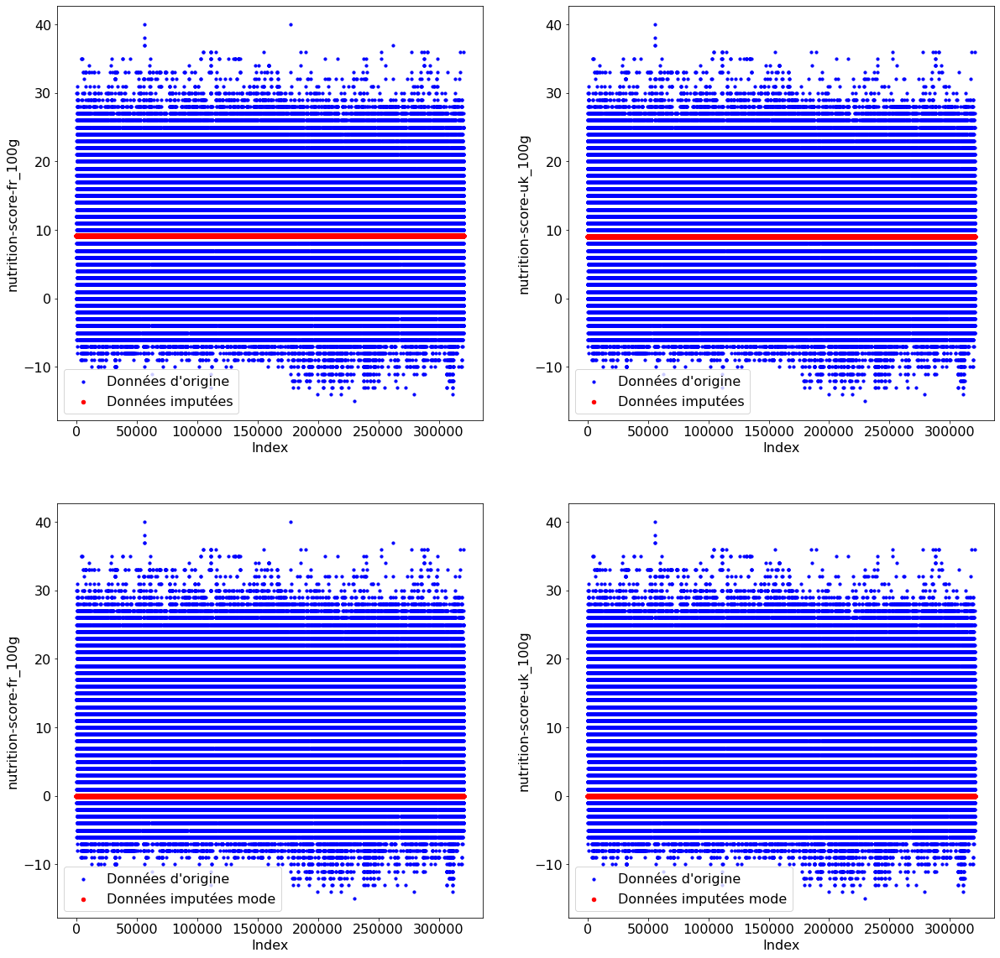

In [115]:
from sklearn.impute import SimpleImputer

# Créer une instance de la classe SimpleImputer pour l'imputation de la moyenne
imputeur_moyenne = SimpleImputer(strategy='mean')

# Créer une instance de la classe SimpleImputer pour l'imputation du mode
imputeur_mode = SimpleImputer(strategy='most_frequent')

# Imputer les valeurs manquantes avec la moyenne
df['nutrition-score-fr_100g_imp'] = imputeur_moyenne.fit_transform(df[['nutrition-score-fr_100g']])

# Imputer les valeurs manquantes avec le mode
df['nutrition-score-fr_100g_mode_imp'] = imputeur_mode.fit_transform(df[['nutrition-score-fr_100g']])


# Imputer les valeurs manquantes avec la moyenne
df['nutrition-score-uk_100g_imp'] = imputeur_moyenne.fit_transform(df[['nutrition-score-uk_100g']])

# Imputer les valeurs manquantes avec le mode
df['nutrition-score-uk_100g_mode_imp'] = imputeur_mode.fit_transform(df[['nutrition-score-uk_100g']])

# Créer des masques pour les valeurs manquantes dans les colonnes d'origine
masque_fr = df['nutrition-score-fr_100g'].isnull()
masque_uk = df['nutrition-score-uk_100g'].isnull()

# Créer deux graphiques à dispersion, un pour chaque colonne
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))
fontsize = 16
# Tracer le graphique pour la colonne 'nutrition-score-fr_100g'
ax1.scatter(df.index[~masque_fr], df['nutrition-score-fr_100g'][~masque_fr], s=10, color='blue', label='Données d\'origine')
ax1.scatter(df.index[masque_fr], df['nutrition-score-fr_100g_imp'][masque_fr], s=20, color='red', label='Données imputées')
ax1.set_xlabel('Index', fontsize=fontsize)
ax1.set_ylabel('nutrition-score-fr_100g', fontsize=fontsize)
ax1.legend(fontsize=fontsize)

# Tracer le graphique pour la colonne 'nutrition-score-uk_100g'
ax2.scatter(df.index[~masque_uk], df['nutrition-score-uk_100g'][~masque_uk], s=10, color='blue', label='Données d\'origine')
ax2.scatter(df.index[masque_uk], df['nutrition-score-uk_100g_imp'][masque_uk], s=20, color='red', label='Données imputées')
ax2.set_xlabel('Index', fontsize=fontsize)
ax2.set_ylabel('nutrition-score-uk_100g', fontsize=fontsize)
ax2.legend(fontsize=fontsize)

# Tracer le graphique pour la colonne 'nutrition-score-fr_100g'
ax3.scatter(df.index[~masque_fr], df['nutrition-score-fr_100g'][~masque_fr], s=10, color='blue', label='Données d\'origine')
ax3.scatter(df.index[masque_fr], df['nutrition-score-fr_100g_mode_imp'][masque_fr], s=20, color='red', label='Données imputées mode')
ax3.set_xlabel('Index', fontsize=fontsize)
ax3.set_ylabel('nutrition-score-fr_100g', fontsize=fontsize)
ax3.legend(fontsize=fontsize)

# Tracer le graphique pour la colonne 'nutrition-score-uk_100g'
ax4.scatter(df.index[~masque_uk], df['nutrition-score-uk_100g'][~masque_uk], s=10, color='blue', label='Données d\'origine')
ax4.scatter(df.index[masque_uk], df['nutrition-score-uk_100g_mode_imp'][masque_uk], s=20, color='red', label='Données imputées mode')
ax4.set_xlabel('Index', fontsize=fontsize)
ax4.set_ylabel('nutrition-score-uk_100g', fontsize=fontsize)
ax4.legend(fontsize=fontsize)


for ax in (ax1, ax2, ax3, ax4):
    ax.tick_params(axis='both', which='major', labelsize=fontsize)

# Afficher les graphiques
plt.show()


Comme le montrent les graphiques, les méthodes d'imputation de la moyenne et du mode ne sont pas efficaces et cohérentes avec les résultats d'origine. Les valeurs de nutrition score_fr et _uk sont liées aux valeurs nutritionnelles. Si l'imputation est effectuée avec les données moyennes ou les données les plus fréquentes, elle ne donnera pas de résultat logique.

<a id='subsec:RégressionLinéaire'></a> 
### Régression Linéaire

Cette analyse utilise la régression linéaire pour prédire les valeurs manquantes de la variable "nutrition-score-fr_100g" à partir d'autres variables nutritionnelles présentes dans le jeu de données. L'objectif est de remplir les données manquantes pour obtenir une base de données plus complète et de mieux comprendre les relations entre les variables nutritionnelles et le score nutritionnel.

In [116]:
# On définit les colonnes à conserver
columns_to_keep = ['product_name','package_score',
       'packaging',  'brands','eco_score',
       'categories', 'environmental_score',
       'origins_tags', 'manufacturing_places_tags',
       'labels_tags', 
       'main_category',
       'purchase_places',  'countries_tags',
       'additives_n',
       'ingredients_from_palm_oil_n', 
       'ingredients_that_may_be_from_palm_oil_n',
       'nutrition_grade_fr',
       'energy_100g',
       'fat_100g', 
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 
       'nutrition-score-fr_100g', 'nutrition-score-uk_100g']


# On crée une nouvelle liste vide
df_filtered = []

# On sélectionne les lignes de df_reset où :
# - bool_series est True
# - la colonne energy_100g n'est pas nulle
# - la colonne fat_100g n'est pas nulle
# - la colonne sugars_100g n'est pas nulle
# - la colonne carbohydrates_100g n'est pas nulle
# - la colonne proteins_100g n'est pas nulle
# - la colonne salt_100g n'est pas nulle
# - la colonne nutrition_grade_fr n'est pas égale à 'Unknown'
# On conserve seulement les colonnes définies dans columns_to_keep pour les données sélectionnées et on supprime les lignes contenant des valeurs nulles
df_filtered = df.loc[   
                    (df["energy_100g"].notna())  &
                    (df["fat_100g"].notna())  &
                    (df["sugars_100g"].notna())  &
                    (df["carbohydrates_100g"].notna())  &
                    (df["energy_100g"].notna())  &
                    (df["proteins_100g"].notna())  &
                    (df["salt_100g"].notna())][columns_to_keep]



In [117]:
from sklearn.linear_model import LinearRegression

# Sélectionner les colonnes à utiliser comme prédicteurs
columns_to_predict = ['nutrition-score-fr_100g']
columns_predictors = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'salt_100g']

# Créer une copie du DataFrame avec les colonnes sélectionnées
df_f = df_filtered[columns_to_predict + columns_predictors].copy()

# Créer un masque pour les valeurs manquantes
mask = df_filtered['nutrition-score-fr_100g'].isna()

# Créer le modèle de régression linéaire
model = LinearRegression()

# Entraîner le modèle avec les données non manquantes
X_train = df_f[columns_predictors][~mask].dropna()
y_train = df_f['nutrition-score-fr_100g'][~mask]
model.fit(X_train, y_train)

# Prédire les valeurs manquantes
X_test = df_f[columns_predictors][mask]
y_pred = model.predict(X_test)

# Remplir les valeurs manquantes avec les prédictions
df_f.loc[mask, 'nutrition-score-fr_100g_imputed_LR'] = y_pred



Ces graphiques permettent de visualiser l'efficacité de la méthode de régression linéaire pour imputer les valeurs manquantes de la colonne 'nutrition-score-fr_100g' en fonction des autres variables.

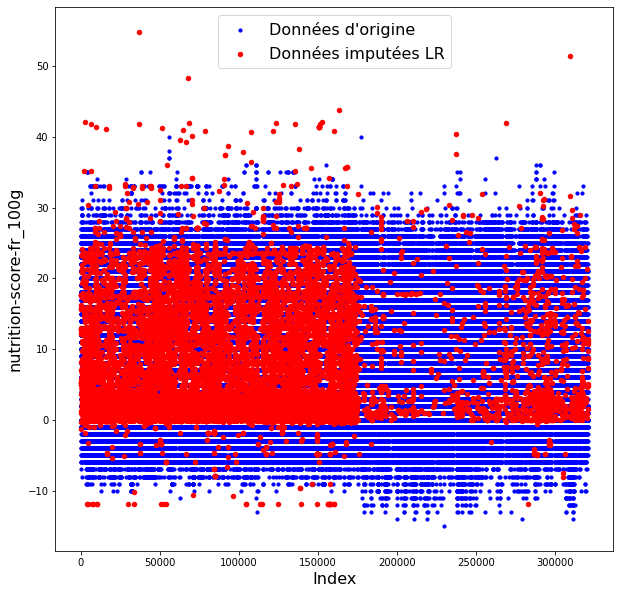

In [118]:
fig, ax = plt.subplots(figsize=(10, 10))
fontsize = 16
# Tracer le graphique pour la colonne 'nutrition-score-fr_100g'
ax.scatter(df_f.index[~mask], df_f['nutrition-score-fr_100g'][~mask], s=10, color='blue', label='Données d\'origine')
ax.scatter(df_f.index[mask], df_f['nutrition-score-fr_100g_imputed_LR'][mask], s=20, color='red', label='Données imputées LR')
ax.set_xlabel('Index', fontsize=fontsize)
ax.set_ylabel('nutrition-score-fr_100g', fontsize=fontsize)
ax.legend(fontsize=fontsize)

Selon les résultats, la méthode de régression linéaire est plus performante que les méthodes d'imputation de moyenne et de mode. Elle peut trouver des valeurs diverses. Cependant, comme vous pouvez le voir, des valeurs supérieures à 40 sont visibles. La valeur nutrition_score_fr prend une valeur maximale de 40. En conséquence, la méthode de régression linéaire n'est pas très performante pour remplir les données.

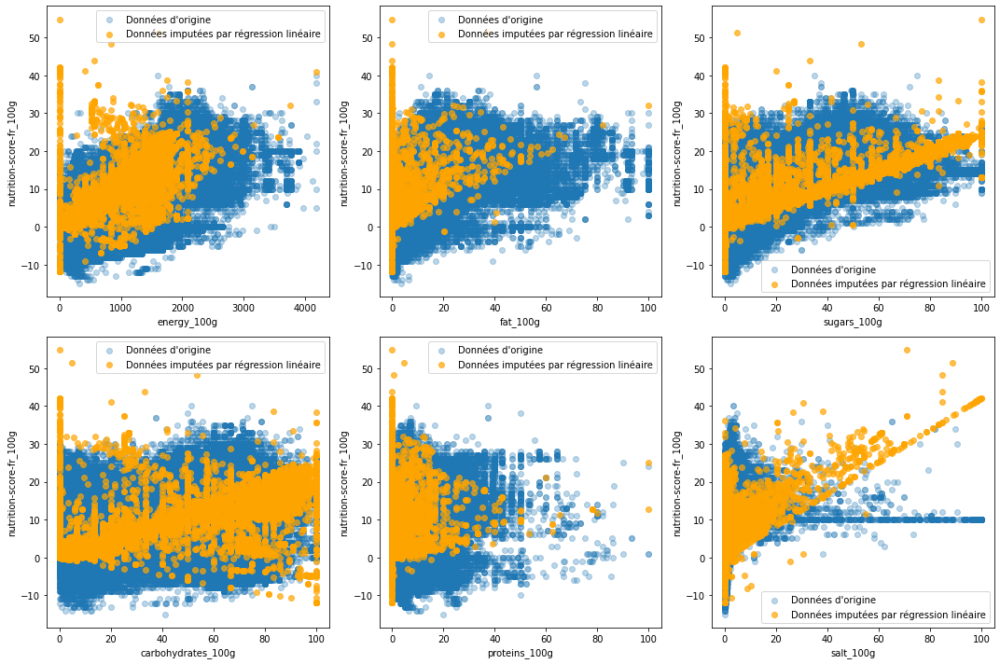

In [119]:
# Définir le nombre de lignes et de colonnes pour les sous-graphiques
nrows = 2
ncols = 3

# Créer des sous-graphiques avec le nombre spécifié de lignes et de colonnes
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 10))

# Aplatir le tableau des sous-graphiques pour boucler à travers chacun d'eux
axs = axs.flatten()

# Boucler à travers chaque colonne de prédicteurs
for i, col in enumerate(columns_predictors):
    
    # Créer un graphique en nuage de points pour les données d'origine
    axs[i].scatter(df_f[col], df_f['nutrition-score-fr_100g'], alpha=0.3, label='Données d\'origine')
    
    # Créer un graphique en nuage de points pour les données complétées en utilisant la régression linéaire
    axs[i].scatter(df_f[col][mask], df_f['nutrition-score-fr_100g_imputed_LR'][mask], alpha=0.7, color='orange', label='Données imputées par régression linéaire')
    
    # Définir les étiquettes de l'axe et la légende
    axs[i].set_xlabel(col)
    axs[i].set_ylabel('nutrition-score-fr_100g')
    axs[i].legend()

# Ajuster l'espacement des sous-graphiques et afficher le graphique
plt.tight_layout()
plt.show()

Si l'on examine les overplots des données prédites par régression linéaire par rapport aux données originales, on peut constater que la plupart des nouvelles valeurs sont distribuées linéairement. Par conséquent, nous ne pouvons pas voir le résultat attendu, en particulier les valeurs de graisse et de sel illustrent clairement cette situation.

<a id='sec:ConclusionEtPerspectives'></a>
# Conclusion et perspectives 

Ce notebook a travaillé sur les types de données de chaque colonne et a analysé les valeurs des colonnes avec des graphiques spécifiques. Ensuite, les valeurs manquantes de nutrition_grade ont été remplies en utilisant les méthodes de mapping de données et de KNN. En outre, les méthodes de régression linéaire et d'imputation ont été explorées et appliquées, mais elles n'ont pas donné des résultats satisfaisants. Par conséquent, ces approches ont été abandonnées. Le prochain notebook se concentrera davantage sur l'analyse des données.

In [120]:
df_filtered.to_csv('my_dataframe.csv')